# Overview: 
The aim of this notebook is to create a model that will predict the price of strawberries at a 2 weeks horizon, using past data to train the model and the 2022-2023 season data for testing

The notebook is split into 4 sections. Section 1 contains setup code. Section 2 contains data cleaning and feature engineering functions. Section 3 contains an exploratory data analysis whilst section 4 contains code for building the forecasting model.


## 1.0 - Setup

In [1]:
import pandas as pd
import seaborn as sns
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt

# Set default figure size
plt.rcParams["figure.figsize"] = (16, 8)
# Turn off chained assignments warning
pd.options.mode.chained_assignment = None

In [2]:
# Set variables
WEATHER_COLS = ['windspeed','temp','cloudcover','precip','solarradiation']
PRICE_COLS = ['price_min','price_max','price']
WEEK_LAGS = 4
HORIZON_WEEKS = 2

## 2.0 - Data Cleaning & Feature Engineering

In [3]:
# Helper functions
def clean_data(df):
    # Remove index column
    clean_data = df.iloc[:, 1:]
    # Convert date columns from string to datetime
    clean_data.start_date = pd.to_datetime(clean_data['start_date'], format="%Y-%m-%d")
    clean_data.end_date = pd.to_datetime(clean_data['end_date'], format="%Y-%m-%d")
    # fill start_date missing values
    clean_data['start_date_complete'] = pd.to_datetime(df.year.astype(str)+'-'+(df.week-1).astype(str)+'-1', format="%Y-%W-%w")


    return clean_data

def lag_column(df, col_name, num_lags):
    for i in range(1, num_lags + 1):
        df.loc[:, f'{col_name}_lag_{i}'] = df[col_name].shift(i)

    return df

def add_summary_stats(df, feature):
    """
    Generate sum, mean, min and max stats for a given feature.

    Input:
    df (pandas.DataFrame) - Dataframe containing feature data
    feature (string) - Used to select column names matching the string. Can be used to summarise lagged features

    Output:
    The original pandas dataframe with summary columns appended
    """
    feature_cols = df.columns[df.columns.str.contains(feature)]
    feature_subset = df.loc[:, feature_cols]
    df[f'{feature}_sum'] = feature_subset.sum(axis=1)
    df[f'{feature}_avg'] = feature_subset.mean(axis=1)
    df[f'{feature}_min'] = feature_subset.min(axis=1)
    df[f'{feature}_max'] = feature_subset.max(axis=1)

    return df

def label_test_train(df, test_seasons):
    """
    Add a column to identify whether a record is in the train or test subset

    Input:
    df (pandas.DataFrame) - A dataframe containing all records
    test_seasons (list) - An integer list containing the years of seasons that should be in the test subset

    Output
    A pandas series with boolean values, where True represents that a record is in the test subset
    """
    return df.season_start_year.isin(test_seasons)

def apply_feature_engineering(df):
    # Extract month and year from market dates
    df['start_month'] = df.start_date.dt.month
    df['start_year'] = df.start_date.dt.year
    df['end_month'] = df.end_date.dt.month
    df['end_year'] = df.end_date.dt.year

    # Add season start feature
    # Since seasons span over 2 calendar years, this will help distinguish crop seasons rather than calendar year
    df['season_start_year'] = df.year.min() + ((~df.price.isna()).astype(int).diff()==1).cumsum() - 1
    # Calculate difference between min and max price
    df['price_min_max_diff'] = df.price_max - df.price_min
    # Add price in 2 weeks' time (target variable)
    df[f'price_in_{HORIZON_WEEKS}_weeks'] = df.price.shift(-HORIZON_WEEKS)
    # Add historical price summary
    df = lag_column(df, 'price', 2)
    
    # Lag weather columns
    for col in WEATHER_COLS:
        df = lag_column(df, col, WEEK_LAGS)
        df = add_summary_stats(df, col)

    # As per the requirements, 2022-2023 season data will be set as Test data
    df['is_test'] = label_test_train(df, [2022])

    return df


In [4]:
# Load data (exclude index column)
raw_data = pd.read_csv('senior_ds_test.csv')
# Clean data
clean_data = clean_data(raw_data)
# Apply feature engineering
eng_data = apply_feature_engineering(clean_data)

## 3.0 - Exploratory Data Analysis

### Summary:
- 10 years of data (2013 - 2023)
- 2013 and 2023 have missing weeks
- Category and unit contain only 1 value (and null when market data is unavailable)
- Weather data is always available but price data contains nulls.
- Values for weather data are within the expected ranges
- No market records are available for weeks 26 - 44. This may indicate that strawberries are out of season
- Earliest season start was in week 45 (November) and latest end was in week 25 (June)
- Strawberries were always available between weeks 50 and 22
- Price of strawberries peaks around week 49 then slowly goes down throughout the season. A small spike is often observed around week 5.
- In general, an upward trend is observer in the price from one season to another


### Notes:
- Category and unit do not add information since they have a single value. These can be eliminated


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

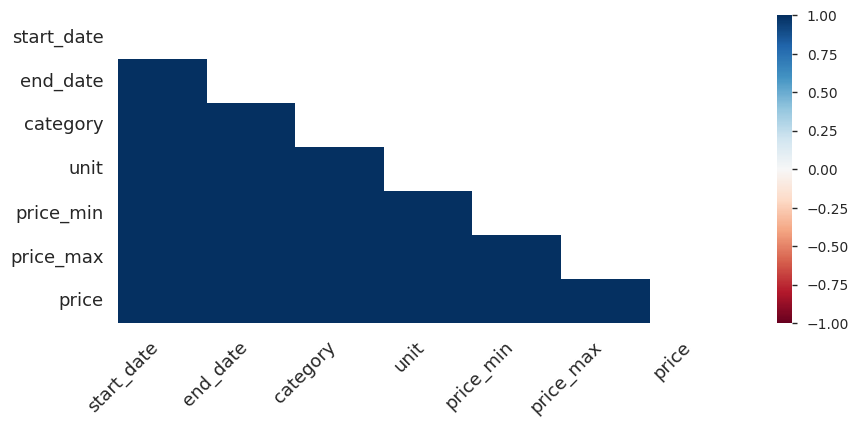

In [16]:
# Use ydata profiling to create a data summary
# TO DO: Profiling report is causing seaborn and matplotlib plots to not show.
ProfileReport(raw_data, title="Profiling Report")

Strawberries are out of season between weeks 26 and 44

[]

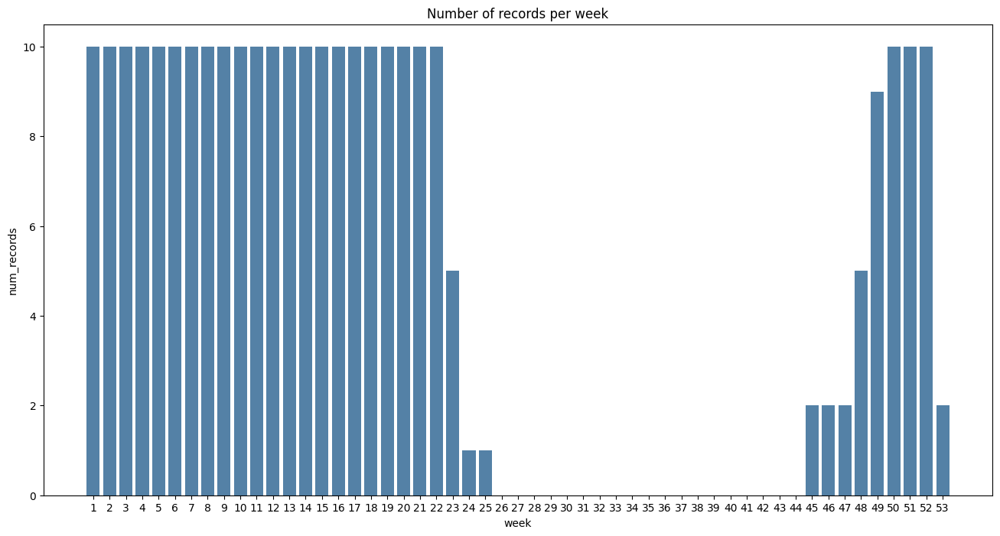

In [6]:
# Count the number of sales records available per week of the year
weekly_records = eng_data.groupby('week', as_index=False).start_date.count()
ax = sns.barplot(x=weekly_records.week, y=weekly_records.start_date, color='steelblue')
ax.set_ylabel('num_records')
ax.set_title('Number of records per week')
ax.plot()

- In general, strawberries are most expensive at the beginning of the season, then become cheaper over time
- An upward trend is visible in price over the years
- Since crop seasons span over 2 calendar years, it is good to have a feature that allows grouping by season (season_start_year)

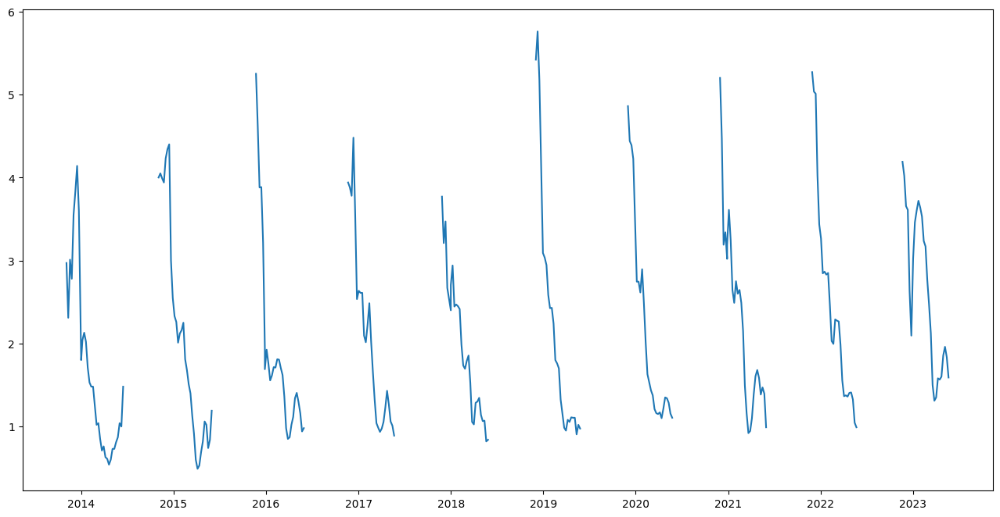

In [7]:
# Plot price over time
plt.plot(eng_data.start_date_complete, eng_data.price);

Grouping price by week of the year shows that price peaks around week 49, then gradually goes down. A small increase is noted again towards week 18.

<Axes: xlabel='week', ylabel='price'>

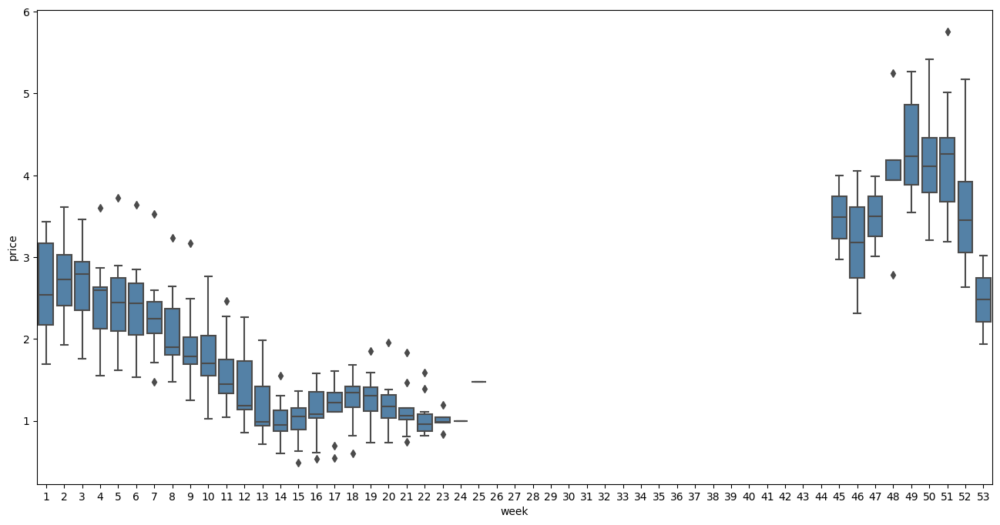

In [8]:
sns.boxplot(data=eng_data, x='week', y='price', color='steelblue')

Text(0.5, 1.0, 'Yearly price summary')

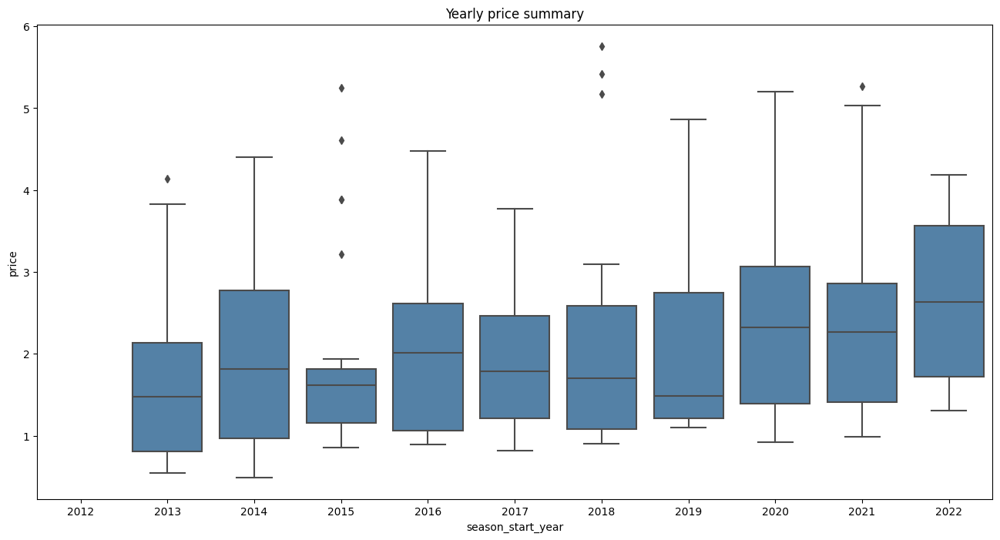

In [9]:
sns.boxplot(data=eng_data, x='season_start_year', y='price', color='steelblue')
plt.title('Yearly price summary')

## 4.0 - Forecasting Model

### Summary:
- Three tests were carries out to test the model performance using different input features. The first test consists of raw data only, the second test adds lagged price data and the third set adds summarised weather data.
- The model was evaluated using MAE and RMSE scores
- Due to time constraints, no hyperparameter tuning was performed and only the XGBoost algorithm was tested

### Results:
Test 1 obtained the best RMSE and MAE scores, however the worst case error was smaller in test 2. Test 3 performed the worst out of all 3. 

### Future work
- Add longer lags to incorporate data from past seasons
- Add better summary statistics e.g to indicate price direction
- Test different ML algorithms such as LSTM and Prophet
- Apply hyperparameter tuning

In [10]:
import numpy as np
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [11]:
def train_test_split(df, features_cols, label_col):
    """
    Split data into train/test and feature/label subsets
    """
    X_train = df.loc[df.is_test==False, features_cols]
    y_train = df.loc[df.is_test==False, label_col]
    X_test = df.loc[df.is_test==True, features_cols]
    y_test = df.loc[df.is_test==True, label_col]

    return X_train, y_train, X_test, y_test

def plot_feature_importance(reg):
    """
    Generates a bar chart showing the feature importance.
    """
    feat_imp = pd.DataFrame(data=reg.feature_importances_,
            index=reg.feature_names_in_,
            columns=['importance']
            ).sort_values('importance', ascending=False)
    
    ax = sns.barplot(x=feat_imp.index, y=feat_imp.importance.values, color='steelblue')
    ax.bar_label(ax.containers[0])
    plt.show()

def plot_actual_vs_pred(actual, pred, x_labels):
    """
    Plots the actual prices and predicted prices on the same plot

    Input:
    actual (pd.Series) - A pandas series containing the target values
    pred (pd.Series) - A pandas series containing the predicted values
    x_labels (pd.Series) - A pandas series with values to be used as x-ticks

    Output:
    A plot showing actual and predicted prices
    """
    ax = pred.plot(style='--')
    actual.plot(ax=ax)
    ax.set_title("Actual Price vs Predicted Price")
    plt.legend(['Predictions', 'Actual'])
    plt.xticks(pred.index, x_labels)
    plt.show()

def get_absolute_error(actual, pred, weeks):
    """
    Calculates the absolute error between each sample and returns the min and max error

    Input:
    actual (pd.Series) - A pandas series containing the target values
    pred (pd.Series) - A pandas series containing the predicted values

    Output:
    A printout of min and max absolut errors
    """   
    error=pd.Series(np.abs(actual-pred))
    error.index = weeks
    max_error = error.max()
    max_error_idx = error.idxmax()
    print(f'Max error of €{max_error:0.2f} happened on week {max_error_idx}')

    min_error = error.min()
    min_error_idx = error.idxmin()
    print(f'Min error of €{min_error:0.2f} happened on week {min_error_idx}')

def get_rmse(actual, pred):
    """
    Calculate root mean squared error

    Input:
    actual (pd.Series) - A pandas series containing the target values
    pred (pd.Series) - A pandas series containing the predicted values

    Output:
    A printout of the RMSE
    """
    rmse = np.sqrt(mean_squared_error(actual, pred))
    print(f'RMSE = {rmse:0.2f}')

def get_mae(actual, pred):
    mae = mean_absolute_error(actual, pred)
    print(f'MAE = {mae:0.2f}')

def get_evaluation_metrics(actual, pred, weeks):
    """
    Prints a summary of absolute error, root mean squared error (RMSE) and mean absolute error (MAE)

    Input:
    actual (pd.Series) - A pandas series containing the target values
    pred (pd.Series) - A pandas series containing the predicted values
    weeks (pd.Series) - The week number corresponding to the actual and pred index

    Output:
    Prints the absolute error, rmse and mae to console
    """
    get_absolute_error(actual, pred, weeks)
    get_rmse(actual, pred)
    get_mae(actual, pred)

def run_modelling_test(X_train, y_train, X_test, y_test):
    """
    A function that combines model training and evaluation, used to quickly test different model and feature combinations.
    Trains an XGBoost regressor, plots the feature importance, plots the actual vs predicted values and prints evaluation metric results

    Input:
    X_train (pd.DataFrame) - Training features
    y_train (pd.Series) - Training target labels
    X_test (pd.DataFrame) - Testing features
    y_test (pd.Series) - Testing target labels

    Output:
    A combination of plots and print out statements
    """
    reg = xgb.XGBRegressor(n_estimators=1000)
    reg.fit(X_train, y_train.fillna(0),
            eval_set=[(X_train, y_train.fillna(0)), (X_test, y_test.fillna(0))],
            early_stopping_rounds=50,
        verbose=False)
    
    plot_feature_importance(reg)

    pred = pd.Series(reg.predict(X_test))
    actual = y_test.reset_index(drop=True)
    plot_actual_vs_pred(actual, pred, X_test.week)

    get_evaluation_metrics(actual, pred, X_test.week)
    

In [12]:
# For modelling purposes. Null values in the price column will be replaced with zero
eng_data['price_in_2_weeks'] = eng_data['price_in_2_weeks'].fillna(0)

### Test 1 - XGBoost with raw weather and price data

#### Results:
- RMSE = 0.68
- MAE = 0.51
- Best case scenario error = €0.0
- Worst case scenario error = €1.59

c:\Users\Jeremy.Borg\Anaconda3\envs\crop_forecasting\lib\site-packages\xgboost\sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


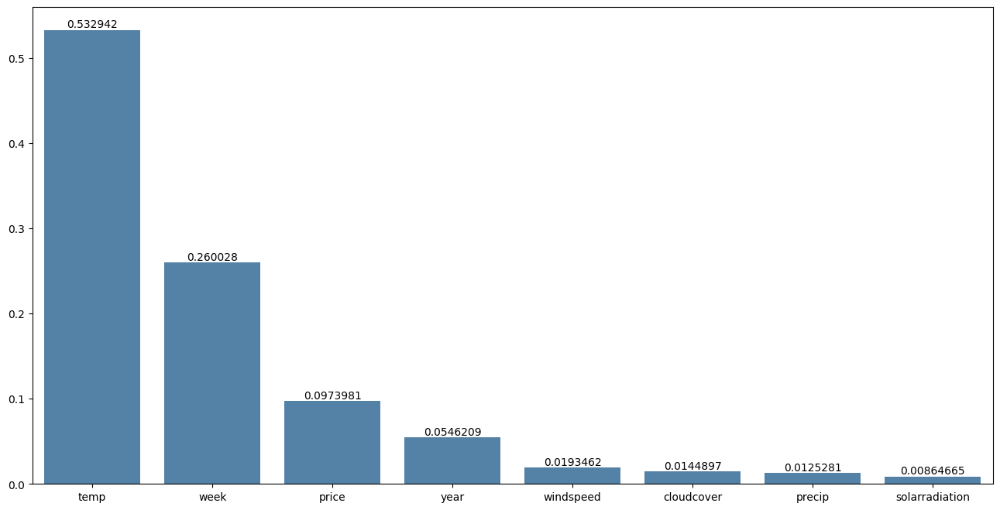

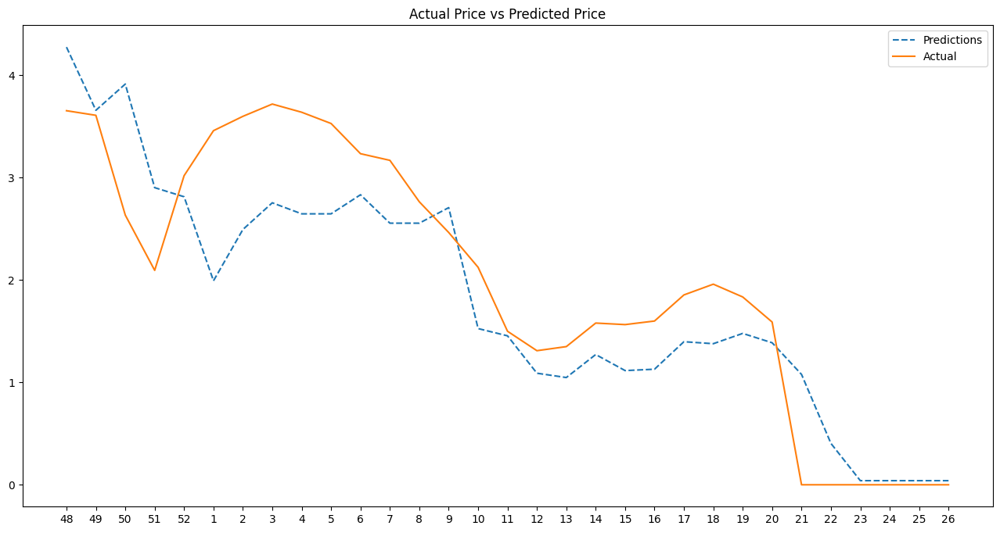

Max error of €1.47 happened on week 1
Min error of €0.04 happened on week 23
RMSE = 0.64
MAE = 0.50


In [13]:
features_cols = ['year', 'week', 'windspeed', 'temp', 'cloudcover', 'precip', 'solarradiation', 'price']
label_col = 'price_in_2_weeks'
X_train, y_train, X_test, y_test = train_test_split(eng_data, features_cols, label_col)

run_modelling_test(X_train, y_train, X_test, y_test);

### Test 2 - XGBoost with lagged price data

#### Results:
- RMSE = 0.71
- MAE = 0.55
- Best case scenario error = €0.01
- Worst case scenario error = €1.45

c:\Users\Jeremy.Borg\Anaconda3\envs\crop_forecasting\lib\site-packages\xgboost\sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


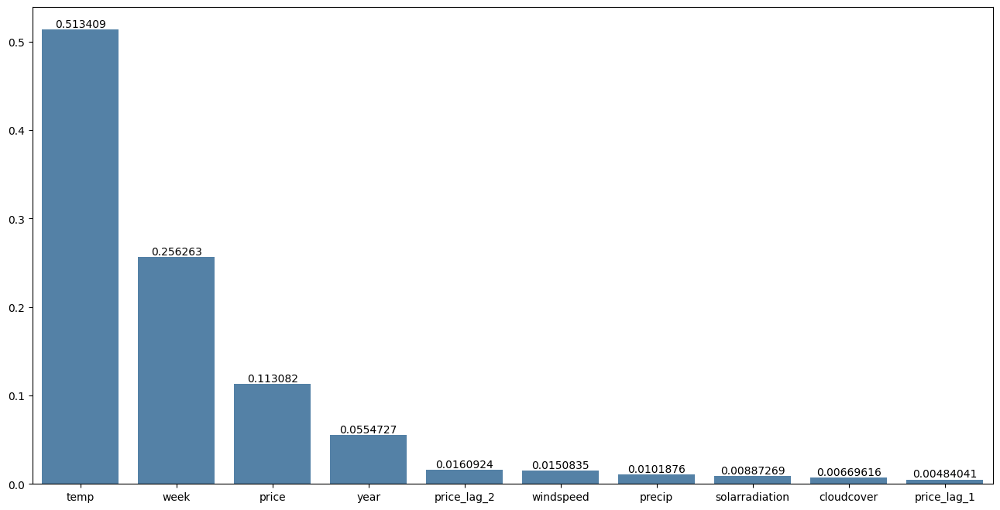

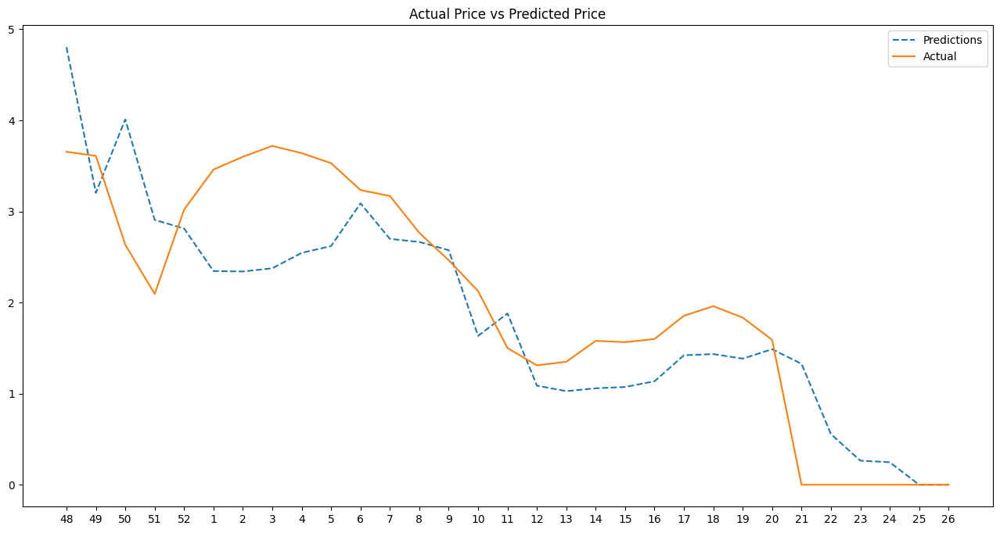

Max error of €1.38 happened on week 50
Min error of €0.00 happened on week 25
RMSE = 0.70
MAE = 0.56


In [14]:
features_cols = ['year', 'week', 'windspeed', 'temp', 'cloudcover', 'precip', 'solarradiation', 'price', 'price_lag_1', 'price_lag_2']
label_col = 'price_in_2_weeks'
X_train, y_train, X_test, y_test = train_test_split(eng_data, features_cols, label_col)

run_modelling_test(X_train, y_train, X_test, y_test)

### Test 3 - XGBoost with lagged price data and engineered weather features

#### Results:
- RMSE = 0.90
- MAE = 0.75
- Best case scenario error = €0.09
- Worst case scenario error = €2.08

c:\Users\Jeremy.Borg\Anaconda3\envs\crop_forecasting\lib\site-packages\xgboost\sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


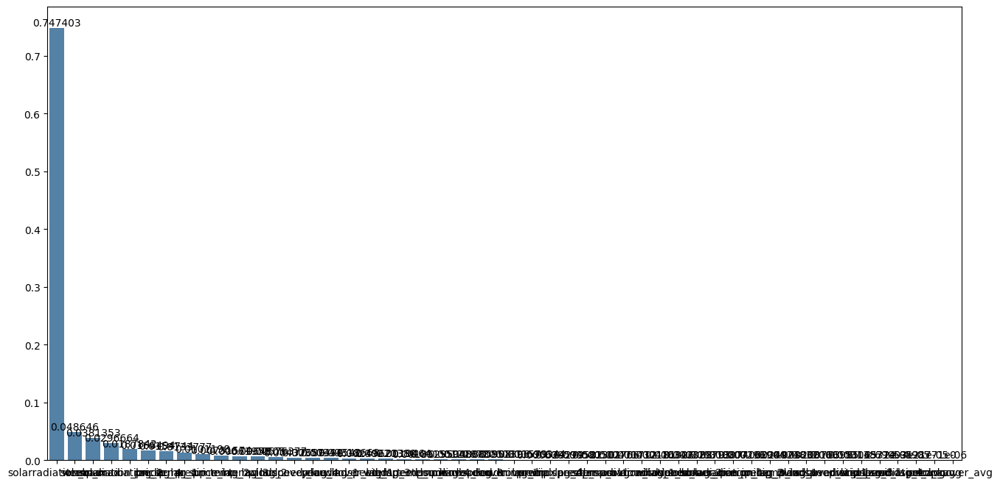

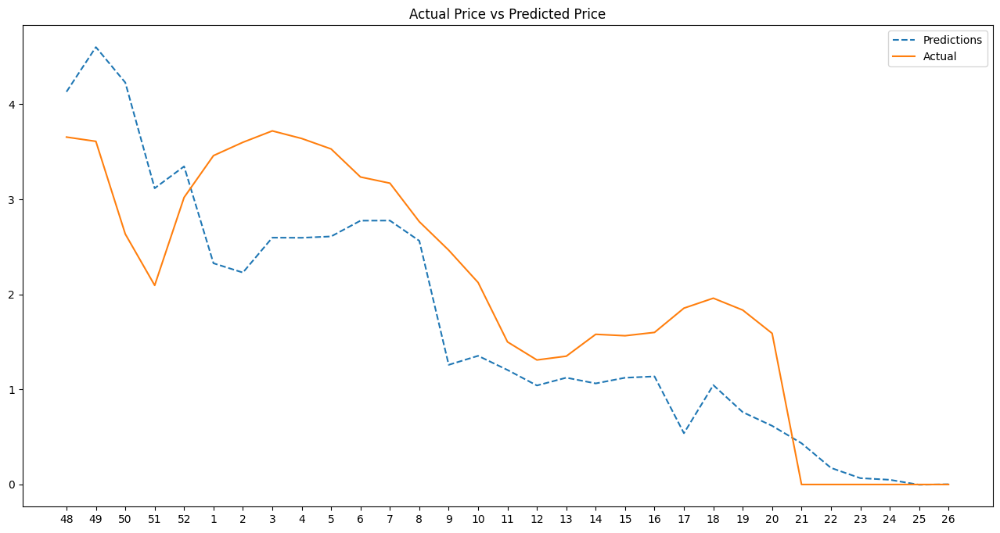

Max error of €1.59 happened on week 50
Min error of €0.00 happened on week 26
RMSE = 0.79
MAE = 0.65


In [15]:
features_cols = ['year', 'week', 'windspeed', 'temp', 'cloudcover', 'precip', 'solarradiation', 'price',
                'price_lag_1', 'price_lag_2','windspeed_lag_1', 'windspeed_lag_2', 'windspeed_lag_3',
                'windspeed_lag_4', 'windspeed_sum', 'windspeed_avg', 'windspeed_min',
                'windspeed_max', 'temp_lag_1', 'temp_lag_2', 'temp_lag_3', 'temp_lag_4',
                'temp_sum', 'temp_avg', 'temp_min', 'temp_max', 'cloudcover_lag_1',
                'cloudcover_lag_2', 'cloudcover_lag_3', 'cloudcover_lag_4',
                'cloudcover_sum', 'cloudcover_avg', 'cloudcover_min', 'cloudcover_max',
                'precip_lag_1', 'precip_lag_2', 'precip_lag_3', 'precip_lag_4',
                'precip_sum', 'precip_avg', 'precip_min', 'precip_max',
                'solarradiation_lag_1', 'solarradiation_lag_2', 'solarradiation_lag_3',
                'solarradiation_lag_4', 'solarradiation_sum', 'solarradiation_avg',
                'solarradiation_min', 'solarradiation_max']
label_col = 'price_in_2_weeks'
X_train, y_train, X_test, y_test = train_test_split(eng_data, features_cols, label_col)

run_modelling_test(X_train, y_train, X_test, y_test)